## 一

利用蒙特卡洛方法计算下列积分：

$$\int_{[0,1]^d} e^{-\sum_{i=1}^{d}x_i} dx$$

1、d=1时

先考虑蒙特卡洛法求积分

$$\int_{[0,1]^d} f(x) dx \approx \frac{1}{n} \sum_{i=1}^{n} f(x_i)$$

其中，$x_i$ 是 $[0,1]^d$ 区间内的随机数。



In [1]:
# 蒙特卡洛求d维积分

import numpy as np
import matplotlib.pyplot as plt
import time

def f(x):
    return np.exp(-sum(x))

def monte_carlo(f, d, n):
    x = np.random.rand(n, d)
    return np.array([f(x[i]) for i in range(n)]).mean() 

给定点数n = $10^2$...$10^7$, 计算积分值，并计时

In [2]:
d=1

exact = (1 - np.exp(-1))**d
error = []
t_m = []
for i in range(2,8):
    n=10**i
    start = time.time()
    monte = monte_carlo(f, d, n)
    end = time.time()
    t_m.append(end - start)
    error.append(np.abs(monte - exact))


采用log-log图，观察误差随点数变化的趋势

exact: 0.6321205588285577
[0.0026719956201759487, 0.0037903042174459722, 0.0003137582173332598, 3.005727668670133e-05, 0.00030062259607077646, 7.762458479332324e-06]


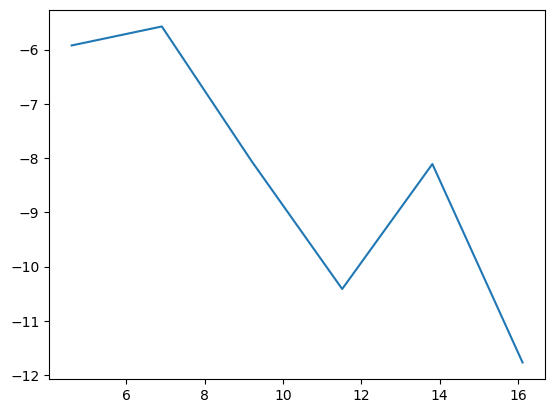

In [3]:
plt.plot(np.array(list(range(2,8)))*np.log(10), np.log(error))

print('exact:', exact)
print(error)

对图像进行线性拟合，得到误差的阶

In [4]:
from sklearn.linear_model import LinearRegression
import numpy as np

# 构造数据
X = np.array(list(range(2,8)))*np.log(10)
X=X.reshape(-1,1)
y = np.array(np.log(error)).reshape(-1,1)
print(X)
print(y)
# 创建线性回归模型
model = LinearRegression()

# 训练模型
model.fit(X, y)

[[ 4.60517019]
 [ 6.90775528]
 [ 9.21034037]
 [11.51292546]
 [13.81551056]
 [16.11809565]]
[[ -5.92492966]
 [ -5.57530899]
 [ -8.06688788]
 [-10.41240577]
 [ -8.10965491]
 [-11.76621146]]


LinearRegression()

斜率约为-0.486，即误差阶大约为半阶

In [5]:
model.coef_

array([[-0.485851]])

考虑复合梯形法

$$\int_{a}^{b} f(x) dx \approx \frac{h}{2} \left[ f(a) + 2 \sum_{i=1}^{n-1} f(x_i) + f(b) \right]$$

其中，$h = \frac{b-a}{n}$，$x_i = a + ih$，$i = 1,2,\dots,n-1$。



In [6]:
#复合梯形法

def f(x):
    return np.exp(-sum(x))

def composite_trapezoidal(f, d, n):
    h = 1/n
    x = np.array([np.array([i*h]) for i in range(n+1)])
    return h*(f(x[0])/2 + sum([f(x[i]) for i in range(1,n)]) + f(x[n])/2)

对同样的点数，利用复合梯形法计算积分值，并计时

In [7]:
d=1

exact = (1 - np.exp(-1))**d
error_t = []
t_t = []
for i in range(2,8):
    n=10**i
    #计时
    start = time.time()
    c_t = composite_trapezoidal(f, d, n)
    end = time.time()
    t_t.append(end - start)
    error_t.append(np.abs(c_t - exact))

利用log-log图，观察误差随点数变化的趋势

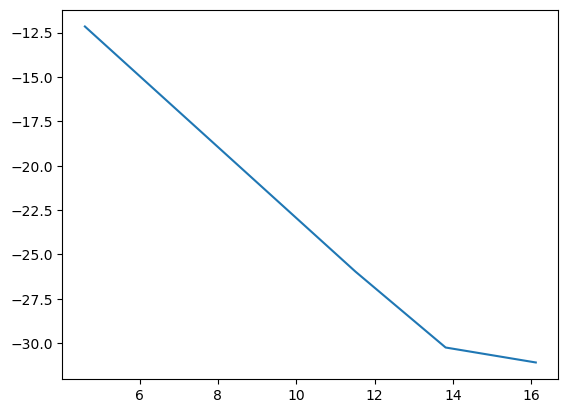

In [8]:
plt.plot(np.array(list(range(2,8)))*np.log(10), np.log(error_t))


对比蒙特卡洛法和复合梯形法的误差

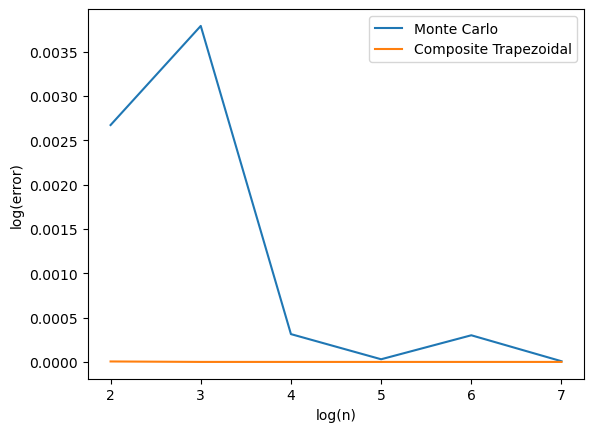

In [9]:
plt.plot(np.array(list(range(2,8))),error,label = 'Monte Carlo')
plt.plot(np.array(list(range(2,8))),error_t,label = 'Composite Trapezoidal')
plt.legend()
plt.xlabel('log(n)')
plt.ylabel('log(error)')
plt.show()

显然，复合梯形法在相同点数下误差更小

对比蒙特卡洛法和复合梯形法的计算时间

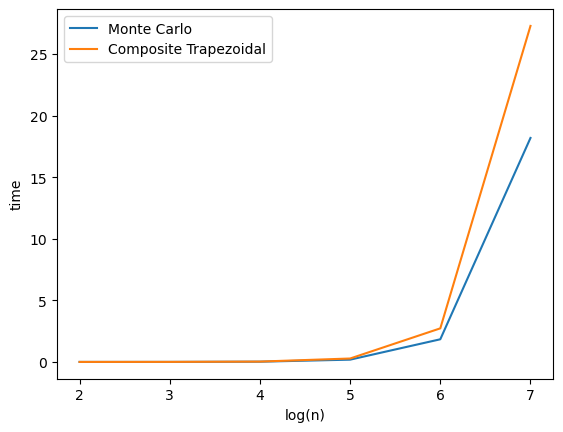

In [10]:
plt.plot(np.array(list(range(2,8))),t_m,label = 'Monte Carlo')
plt.plot(np.array(list(range(2,8))),t_t,label = 'Composite Trapezoidal')
plt.legend()
plt.xlabel('log(n)')
plt.ylabel('time')
plt.show()


观察log-log图，发现蒙特卡罗法和复合梯形法的计算时间随点数的变化趋势为线性

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16672\3753718973.py:1: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.array(list(range(2,8))),np.log(t_m),label = 'Monte Carlo')
C:\Users\lenovo\AppData\Local\Temp\ipykernel_16672\3753718973.py:2: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.array(list(range(2,8))),np.log(t_t),label = 'Composite Trapezoidal')


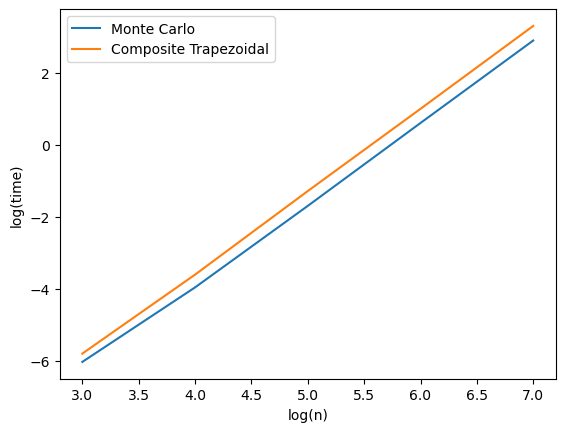

In [11]:
plt.plot(np.array(list(range(2,8))),np.log(t_m),label = 'Monte Carlo')
plt.plot(np.array(list(range(2,8))),np.log(t_t),label = 'Composite Trapezoidal')
plt.legend()
plt.xlabel('log(n)')
plt.ylabel('log(time)')
plt.show()


综上，显然复合梯形法精度更优，但计算时间上蒙特卡洛法更优

2、d=2时，考虑中点矩形法

In [48]:
#中点矩形法

def middle_rectangle(f, d, n):
    nn = int(n**(1/d))+1
    h = 1/nn
    points = np.linspace(0,1,nn)
    points = (points[1:]+points[:-1])/2
    meshes = np.meshgrid(*([points] * d), indexing='ij')
    x = np.stack(meshes,axis = -1)
    x = x.reshape(-1,d)
    return sum([f(x[i]) for i in range(len(x))])*h**d

In [49]:
middle_rectangle(f,2,1000000)

0.3987784119933432

同样重复上述步骤，得到如下结果：

先计算蒙特卡洛法

In [46]:
d=2

exact = (1 - np.exp(-1))**d
print(exact)
error = []
t_m = []
for i in range(2,8):
    n=10**i
    start = time.time()
    monte = monte_carlo(f, d, n)
    end = time.time()
    t_m.append(end - start)
    error.append(np.abs(monte - exact))

0.39957640089372803


exact: 0.39957640089372803
[0.014917232798702884, 0.00506888596138283, 0.0008927295555960502, 9.802444103940156e-05, 5.029065112904796e-06, 7.075838012410296e-05]


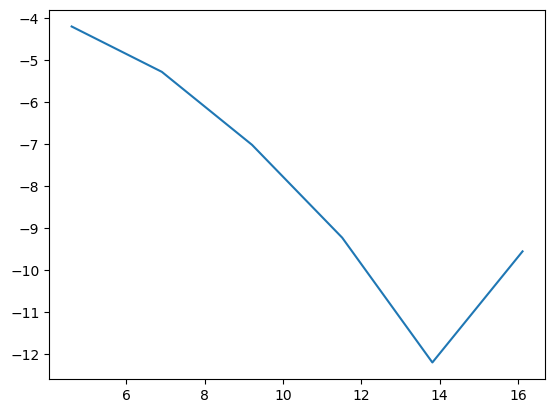

In [47]:
plt.plot(np.array(list(range(2,8)))*np.log(10), np.log(error))

print('exact:', exact)
print(error)

In [50]:
from sklearn.linear_model import LinearRegression
import numpy as np

# 构造数据
X = np.array(list(range(2,8)))*np.log(10)
X=X.reshape(-1,1)
y = np.array(np.log(error)).reshape(-1,1)
print(X)
print(y)
# 创建线性回归模型
model = LinearRegression()

# 训练模型
model.fit(X, y)

[[ 4.60517019]
 [ 6.90775528]
 [ 9.21034037]
 [11.51292546]
 [13.81551056]
 [16.11809565]]
[[ -4.20523817]
 [ -5.28463422]
 [ -7.02122687]
 [ -9.23029371]
 [-12.20027645]
 [ -9.55623958]]


LinearRegression()

In [51]:
model.coef_

array([[-0.61683466]])

蒙塔卡罗法约等于半阶收敛

再计算中点矩形法

$$\int_{[0,1]^2} f(x) dx \approx h^2\sum_{1 \leq i,j \leq n} f\left(x_i, x_j\right)$$

其中，$h = \frac{1}{n}, x_i = ih+ \frac12 h$。




In [52]:
d=2

exact = (1 - np.exp(-1))**d
error_t = []
t_t = []
for i in range(2,8):
    n=10**i
    #计时
    start = time.time()
    c_t = middle_rectangle(f, d, n)
    end = time.time()
    t_t.append(end - start)
    error_t.append(np.abs(c_t - exact))

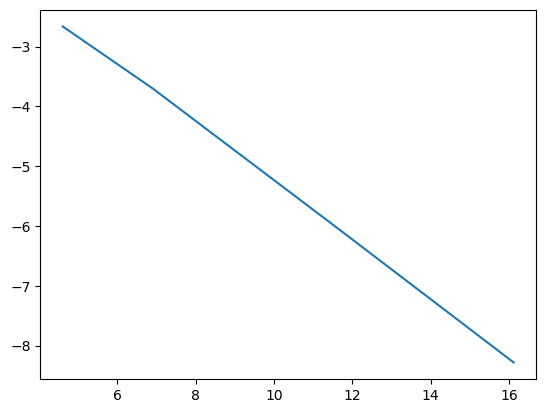

In [53]:
plt.plot(np.array(list(range(2,8)))*np.log(10), np.log(error_t))

In [56]:
from sklearn.linear_model import LinearRegression
import numpy as np

# 构造数据
X = np.array(list(range(2,8)))*np.log(10)
X=X.reshape(-1,1)
y = np.array(np.log(error_t)).reshape(-1,1)
print(X)
print(y)
# 创建线性回归模型
model = LinearRegression()

# 训练模型
model.fit(X, y)

[[ 4.60517019]
 [ 6.90775528]
 [ 9.21034037]
 [11.51292546]
 [13.81551056]
 [16.11809565]]
[[-2.66465997]
 [-3.70436556]
 [-4.84387191]
 [-5.98455178]
 [-7.13341587]
 [-8.28362424]]


LinearRegression()

In [57]:
model.coef_

array([[-0.49041342]])

此时，中点矩形法的误差阶约为0.5

也可由计算方法推知误差阶：

$$O(N*h^3) = O(N*N^{-\frac{3}{2}}) = O(N^{-\frac12})$$

对比二者的误差

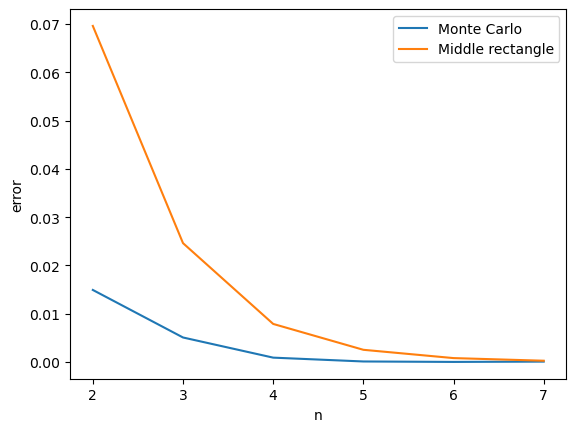

In [55]:
plt.plot(np.array(list(range(2,8))),error,label = 'Monte Carlo')
plt.plot(np.array(list(range(2,8))),error_t,label = 'Middle rectangle')
plt.legend()
plt.xlabel('n')
plt.ylabel('error')
plt.show()

显然，蒙特卡洛法的误差更小，优于中点矩形法

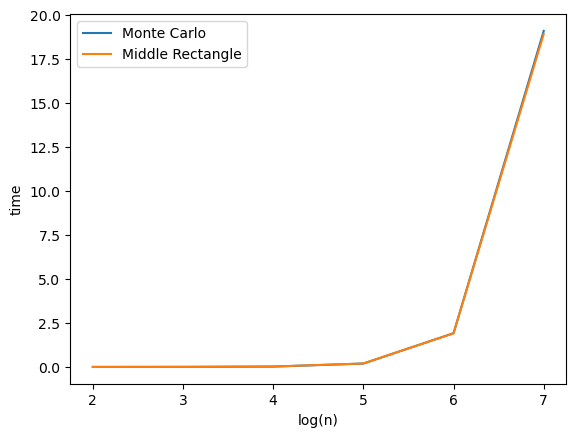

In [21]:
plt.plot(np.array(list(range(2,8))),t_m,label = 'Monte Carlo')
plt.plot(np.array(list(range(2,8))),t_t,label = 'Middle Rectangle')
plt.legend()
plt.xlabel('log(n)')
plt.ylabel('time')
plt.show()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16672\499786811.py:1: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.array(list(range(2,8))),np.log(t_m),label = 'Monte Carlo')
C:\Users\lenovo\AppData\Local\Temp\ipykernel_16672\499786811.py:2: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.array(list(range(2,8))),np.log(t_t),label = 'Middle Rectangle')


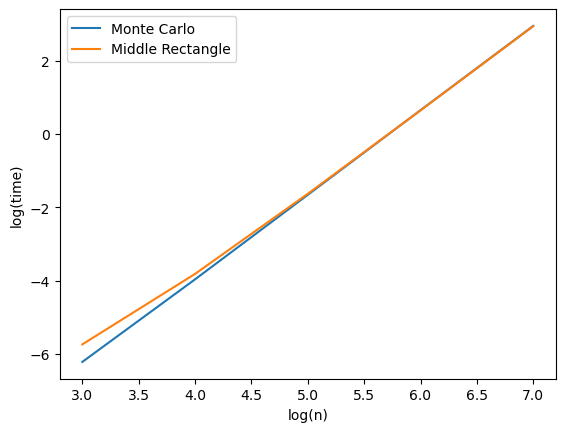

In [22]:
plt.plot(np.array(list(range(2,8))),np.log(t_m),label = 'Monte Carlo')
plt.plot(np.array(list(range(2,8))),np.log(t_t),label = 'Middle Rectangle')
plt.legend()
plt.xlabel('log(n)')
plt.ylabel('log(time)')
plt.show()

中矩形公式和蒙特卡洛法的用时相当，是因为中矩形法相当于蒙特卡洛法取点取在了中点处，计算时没有区别，所以用时相当。

综上，用时相当，误差阶相当。但蒙特卡洛法由于半阶参数上较小，误差更小一点。

3、d = 10时

In [23]:
d=10

exact = (1 - np.exp(-1))**d
print(exact)
error = []
t_m = []
for i in range(2,8):
    n=10**i
    start = time.time()
    monte = monte_carlo(f, d, n)
    end = time.time()
    t_m.append(end - start)
    error.append(np.abs(monte - exact))

0.01018589403201696


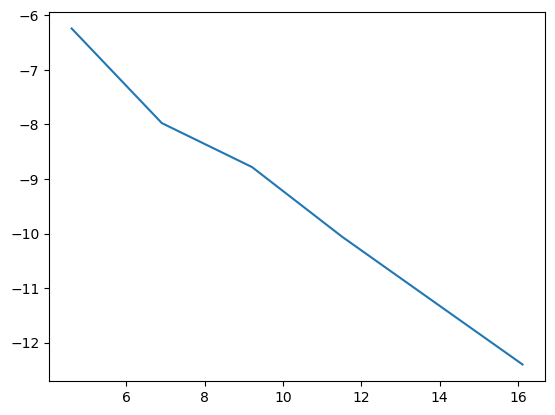

In [24]:
plt.plot(np.array(list(range(2,8)))*np.log(10), np.log(error))

In [25]:
from sklearn.linear_model import LinearRegression
import numpy as np

# 构造数据
X = np.array(list(range(2,8)))*np.log(10)
X=X.reshape(-1,1)
y = np.array(np.log(error)).reshape(-1,1)
print(X)
print(y)
# 创建线性回归模型
model = LinearRegression()

# 训练模型
model.fit(X, y)

[[ 4.60517019]
 [ 6.90775528]
 [ 9.21034037]
 [11.51292546]
 [13.81551056]
 [16.11809565]]
[[ -6.23937483]
 [ -7.97426661]
 [ -8.78055844]
 [-10.05937132]
 [-11.23076738]
 [-12.40066102]]


LinearRegression()

In [26]:
model.coef_

array([[-0.51935101]])

收敛阶为半阶

## 二、

求解Runge函数的回归

In [23]:
import numpy as np

In [24]:
# 龙格函数

def R(x):
    return 1/(1+x**2)

1、
对于线性函数，采用最小二乘法

In [25]:
#线性拟合
N=100

x= np.random.rand(N,1)*10-5

In [26]:
y = R(x)

avr_sq = sum(x**2)/N
avr_x = sum(x)/N
avr_y = sum(y)/N
avr_xy = sum(x*y)/N

计算最小二乘各参数的导数

In [27]:
def L(w,b):
    global x,y,N
    return float(sum((w*x+b-y)**2)/(2*N))

def dL_w(w,b):
    global x,y,avr_sq,avr_x,avr_y,avr_xy
    return float(w*avr_sq + b*avr_x - avr_xy)

def dL_b(w,b):
    global avr_x,avr_y
    return float(b + w*avr_x - avr_y)

In [28]:
def trace_back_search(alpha,beta):
    global w,b,dw,db
    t =1
    while L(w,b)+alpha*t*(-dw**2-db**2)-L(w+t*dw,b+t*db)< 0:
        t = beta*t
    return t

In [29]:
dL_w(1,1),dL_b(1,1)

(8.270262717294452, 0.6176515352743803)

采用梯度下降法，迭代更新参数

In [30]:
w = 1
b = 1
#梯度下降法
while (dL_w(w,b)**2+dL_b(w,b)**2)**0.5 > 0.001:
    dw, db= -dL_w(w,b), -dL_b(w,b)
    t = trace_back_search(0.2,0.5)
    w,b = w+t*dw,b+t*db
    
print(w,b)

0.0028268018136544232 0.281712699168556


In [31]:
import matplotlib.pyplot as plt

画出回归图像

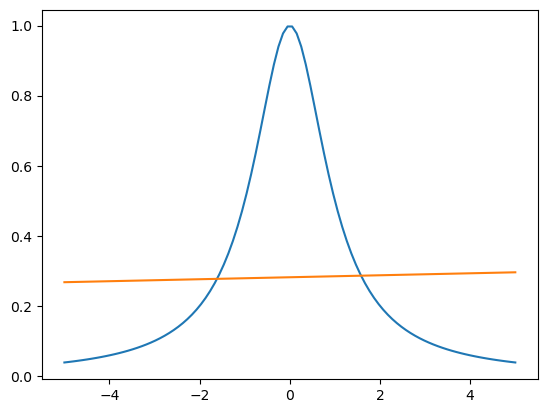

In [32]:
xx = np.linspace(-5,5,100)
yy = R(xx)

plt.plot(xx,yy)
plt.plot(xx, w*xx+b)

In [33]:
L(w,b)

0.040932424714535544

利用牛顿法求解

In [34]:
#牛顿法

dL_ww = avr_sq
dL_wb = avr_x
dL_bw = avr_x
dL_bb = 1

det_H = avr_sq - avr_x**2

invH_11 = 1/float(det_H)
invH_12 = float(-avr_x/det_H)
invH_21 = invH_12
invH_22 = float(avr_sq/det_H)

w=1
b=1

while invH_11*dL_w(w,b)**2 + 2*invH_12*dL_w(w,b)*dL_b(w,b) + invH_22*dL_b(w,b)**2 > 0.01:
    dw = -(invH_11*dL_w(w,b) + invH_12* dL_b(w,b))
    db = -(invH_21*dL_w(w,b) + invH_22*dL_b(w,b))
    t = trace_back_search(0.3,0.5)
    w,b = w+t*dw, b+t*db

print(w,b)


0.002719994127854064 0.28141510003930714


画出拟合图像

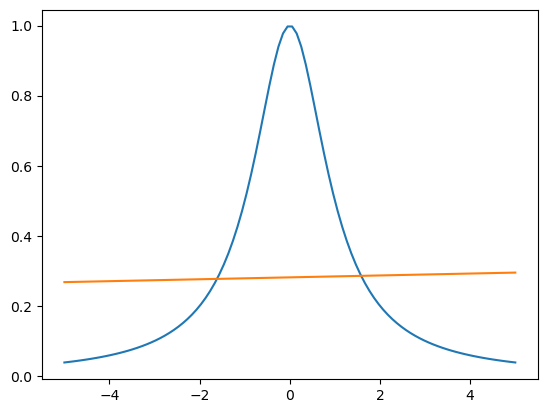

In [35]:
xx = np.linspace(-5,5,100)
yy = R(xx)

plt.plot(xx,yy)
plt.plot(xx, w*xx+b)

In [36]:
L(w,b)

0.04093233593120812

2、考虑多项式回归

In [78]:
# 多项式拟合
N=100

x= np.linspace(-5,5,100)
y =R(x)

def L(a):
    global x,y,N
    sq = 0
    n = len(a)
    for i in range(n):
        sq += a[i]*x**i
    #print(sq)
    return sum((sq-y)**2)/(2*N)

In [79]:
def dL(a):
    h = 0.1
    a = a.tolist()
    n = len(a)
    dL = []
    for i in range(n):
        a_h = a.copy()
        a_h[i] = a[i]+h
        dL.append((L(a_h)-L(a))/h)
    return np.array(dL)

In [80]:
def trace_back_search_n(alpha,beta):
    global a,da
    t =1
    while L(a)-alpha*t*(sum((dL(a)**2)))-L(a+t*da)< 0 and t>min(0.001/sum((dL(a)**2))**0.5,0.0001):
        t = beta*t
    return t

n = 3时，画出拟合图像

In [37]:
n = 3

a = np.array([0.3,0,0,0])
m=0
while np.linalg.norm(dL(a),ord=2)> 0.01:
    m += 1
    print(n)
    da = -dL(a)
    t = trace_back_search_n(0.4,0.5)
    print(dL(a))
    a = a+t*da
    
print(a)


3
[7.76845230e-02 4.25084175e-01 8.32702911e+00 1.18461378e+02]
3
[7.71438167e-02 3.07488013e-01 8.31875980e+00 1.16319676e+02]
3
[7.66036509e-02 1.92025040e-01 8.31049873e+00 1.14216802e+02]
3
[7.60640251e-02 7.86565806e-02 8.30224589e+00 1.12152055e+02]
3
[ 7.55249388e-02 -3.26553387e-02  8.29400129e+00  1.10124742e+02]
3
[ 7.49863912e-02 -1.41948004e-01  8.28576489e+00  1.08134185e+02]
3
[ 7.44483821e-02 -2.49258025e-01  8.27753671e+00  1.06179717e+02]
3
[ 7.39109107e-02 -3.54621347e-01  8.26931673e+00  1.04260684e+02]
3
[ 7.33739766e-02 -4.58073265e-01  8.26110494e+00  1.02376443e+02]
3
[ 7.28375793e-02 -5.59648433e-01  8.25290134e+00  1.00526365e+02]
3
[ 7.23017181e-02 -6.59380877e-01  8.24470591e+00  9.87098286e+01]
3
[ 7.17663927e-02 -7.57304007e-01  8.23651865e+00  9.69262266e+01]
3
[ 7.12316023e-02 -8.53450625e-01  8.22833955e+00  9.51749619e+01]
3
[ 7.06973465e-02 -9.47852941e-01  8.22016860e+00  9.34554480e+01]
3
[ 7.01636249e-02 -1.04054258e+00  8.21200580e+00  9.17671094e+

In [38]:
np.linalg.norm(dL(a),ord=2)
dL(a)
a

array([ 1.33614387,  4.47218725, -0.13167239, -0.29554871])

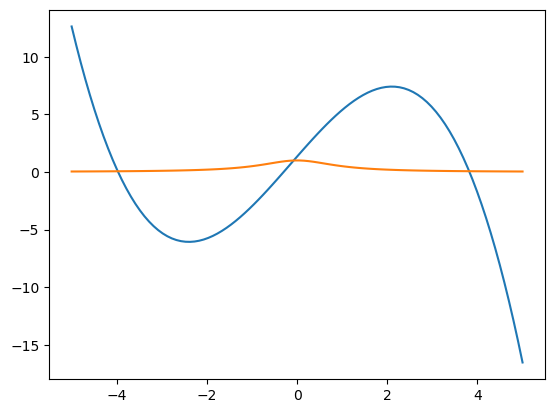

In [39]:
yy = a[0]+a[1]*x+a[2]*x**2+a[3]*x**3

plt.plot(x,yy)
plt.plot(x,y)


In [81]:
a = np.array([ 1.33614387,  4.47218725, -0.13167239, -0.29554871])
L(a)

16.889075081543318

显然，拟合效果非常差。最小二乘函数存在许多的极值点，并且似乎不存在接近0的极值点，所以拟合效果很差。

n = 4时，画出拟合图像

In [42]:
n = 4

a = np.array([ 1.33614387,  4.47218725, -0.13167239, -0.29554871,0])
m=0
while np.linalg.norm(dL(a),ord=2)> 0.1:
    m += 1
    print(n)
    da = -dL(a)
    print(da)
    t = trace_back_search_n(0.4,0.5)
    print(dL(a))
    a = a+t*da
    
print(a)

4
[ 5.60859272e-03  4.38737526e-06 -7.50257276e-03 -1.63363843e-06
 -2.20308475e+03]
[-5.60859272e-03 -4.38737526e-06  7.50257276e-03  1.63363843e-06
  2.20308475e+03]
4
[ 7.39361420e-02  4.38741711e-06  1.23694944e+00 -1.63285172e-06
 -2.17840811e+03]
[-7.39361420e-02 -4.38741711e-06 -1.23694944e+00  1.63285172e-06
  2.17840811e+03]
4
[ 1.41495819e-01  4.38745882e-06  2.46742367e+00 -1.63206547e-06
 -2.15400857e+03]
[-1.41495819e-01 -4.38745882e-06 -2.46742367e+00  1.63206547e-06
  2.15400857e+03]
4
[ 2.08296247e-01  4.38750050e-06  3.68407709e+00 -1.63127968e-06
 -2.12988302e+03]
[-2.08296247e-01 -4.38750050e-06 -3.68407709e+00  1.63127968e-06
  2.12988302e+03]
4
[ 2.74345952e-01  4.38754221e-06  4.88706490e+00 -1.63049442e-06
 -2.10602840e+03]
[-2.74345952e-01 -4.38754221e-06 -4.88706490e+00  1.63049442e-06
  2.10602840e+03]
4
[ 3.39653363e-01  4.38758388e-06  6.07654055e+00 -1.62970942e-06
 -2.08244165e+03]
[-3.39653363e-01 -4.38758388e-06 -6.07654055e+00  1.62970942e-06
  2.082441

1011.7350548567147

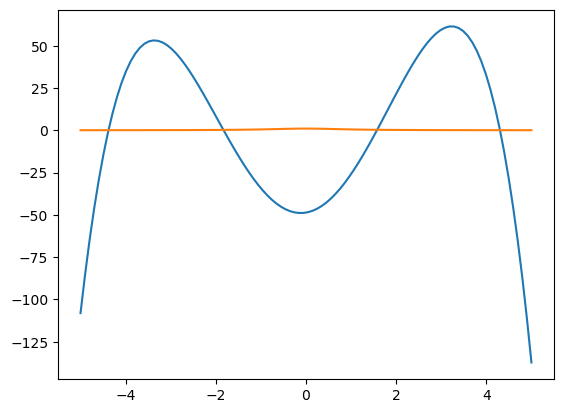

In [82]:
n=4

yy=0

a =np.array([-48.66526677,4.47219225,19.49627986 ,-0.29551788 ,-0.8982887 ])

for i in range(n+1):
    yy += a[i]*x**i

plt.plot(x,yy)
plt.plot(x,y)
L(a)

n = 5时，画出拟合图像

In [48]:
n = 5

a = np.array([1.33614387,  4.47218725, -0.13167239, -0.29554871, 0, 0])
m=0
while np.linalg.norm(dL(a),ord=2)> 0.1:
    m += 1
    print(n)
    da = -dL(a)
    print(da)
    t = trace_back_search_n(0.4,0.5)
    print(dL(a))
    a = a+t*da
    
print(a)

5
[-2.37735025e-01  5.53817950e-01 -9.79490994e+00 -1.00767963e+02
 -2.40587316e+03 -4.86443243e+04]
[ 2.37735025e-01 -5.53817950e-01  9.79490994e+00  1.00767963e+02
  2.40587316e+03  4.86443243e+04]
5
[2.44546173e+03 9.00489441e+05 4.45319019e+04 1.78558227e+07
 8.80809852e+05 3.72364045e+08]
[-2.44546173e+03 -9.00489441e+05 -4.45319019e+04 -1.78558227e+07
 -8.80809852e+05 -3.72364045e+08]
5
[-8.96000000e+05 -6.90960384e+09 -1.62918400e+07 -1.36983363e+11
 -3.23225600e+08 -2.85667086e+12]
[8.96000000e+05 6.90960384e+09 1.62918400e+07 1.36983363e+11
 3.23225600e+08 2.85667086e+12]
5
[-1.37438953e+12  5.22268023e+13 -6.87194767e+11  1.05037720e+15
 -0.00000000e+00  2.19136103e+16]
[ 1.37438953e+12 -5.22268023e+13  6.87194767e+11 -1.05037720e+15
  0.00000000e+00 -2.19136103e+16]
5
[-0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -1.38350581e+20]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.38350581e+20]
[-1.07374252e+10  

5.721808148029555e+41

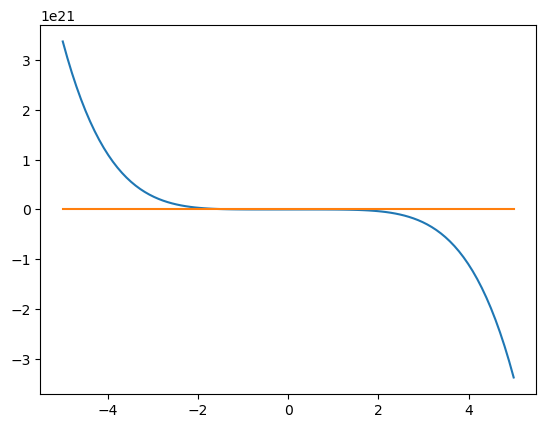

In [83]:
n=5

yy=0

a =np.array([-1.07374252e+10 ,4.07967919e+11,-5.36883605e+09 ,8.20500185e+12 ,-2.51833747e+06,-1.08069273e+18])

for i in range(n+1):
    yy += a[i]*x**i

plt.plot(x,yy)
plt.plot(x,y)
L(a)

综上，多项式回归对于Runge函数的拟合效果很差，无论如何梯度下降，最小二乘函数仍然非常大。这是由于Runge函数在区间[-5,5]形成的复空间的球上不解析性导致的。